In [23]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [24]:
# let's try the yolo 4 model
# input your own path to yolo4 files 

# to upload yolov4 weight file - https://github.com/AlexeyAB/darknet/releases/download/darknet_yolo_v3_optimal/yolov4.weights
# config file will be attached to this project

config_file = "yolov4.cfg"
frozen_model = "yolov4.weights"

In [25]:
# and model yolo 3
# also input your own path to yolo3 files 

# # to upload yolov4 weight file - https://github.com/patrick013/Object-Detection---Yolov3/blob/master/model/yolov3.weights
# config file will be attached to this project

# config_file = "yolov3.cfg"
# frozen_model = "yolov3.weights"

In [26]:
labels = []
# input path to the file with classes
# file is attached to this project 
file_name = "coco.names"
with open(file_name, "r") as f:
    labels = f.read().splitlines()

In [27]:
labels[:5]

['person', 'bicycle', 'car', 'motorbike', 'aeroplane']

In [28]:
# create a model with configuration- and weight- yolo3/4 files
model = cv2.dnn.readNet(frozen_model, config_file)

In [29]:
# input path to your image 
# example one is attached to this project
photo_file = "people.jpg"
img = cv2.imread(photo_file)
# put the length and height of the image into the height, width variables
# in _ we put the number of light channels, since it is not important to us
height, width, _ = img.shape

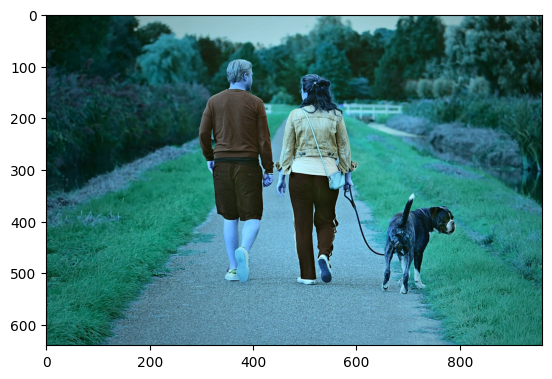

In [30]:
plt.imshow(img)

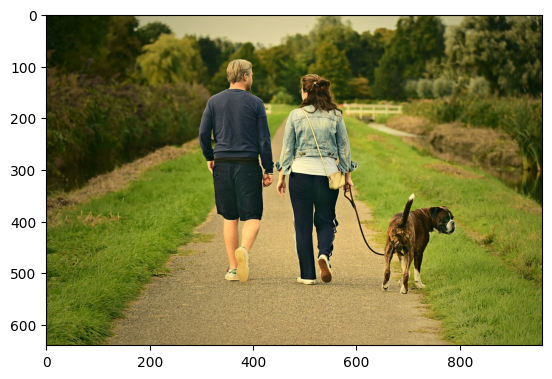

In [31]:
# put image into RGB format
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

In [33]:
blob = cv2.dnn.blobFromImage(img, 1/255, (416, 416), (0, 0, 0), swapRB=True, crop=False)

# cv2.dnn.blobFromImage: This function creates a 4-dimensional binary "blob" from an image.
# It performs image pre-processing such as resizing, changing pixel value range, etc.
# so that it can be passed to the neural network for processing. Function parameters include:

# image: Input image.
#scalefactor: Scale factor to normalize pixel values. The values ​​may vary depending on the network architecture, but typically it is 1/255 to normalize values ​​in the range [0, 1].
# size: The size of the image that the neural network expects.
# swapRB: A flag indicating whether the blue and red channels of the input image should be swapped.
# crop: Flag indicating whether the image should be cropped to the specified size.



# passing a blob object to the model
model.setInput(blob)

In [34]:
# output_layers_names = model.getUnconnectedOutLayersNames():
# This method returns the names of all unconnected model output layers - those that are not connected to other model layers.
# In the context of object detection using YOLO (You Only Look Once), these are usually the last layers
# which contain predictions about the classes and coordinates of objects. YOLO3/4 models ussually have three such layers



output_layers_names = model.getUnconnectedOutLayersNames()
print(output_layers_names)

# output - 'yolo_82', 'yolo_94' and 'yolo_106'
# these layers are highlighted separately because they contain the prediction


# 'yolo_82', 'yolo_94' and 'yolo_106' are the names of the output layers that are responsible for detecting objects at different levels
# Images.

# Each of these layers makes predictions about the presence of objects at different scales of the input image.
# For example, 'yolo_82' could be associated with detecting smaller objects,
# while 'yolo_106' can be associated with larger objects.
# This helps the model to better detect objects of different sizes in the image.

('yolo_139', 'yolo_150', 'yolo_161')


In [35]:
# this line performs the forward pass algorithm and puts the final data of the last layers
# into the layer_outputs variable

layer_outputs = model.forward(output_layers_names)

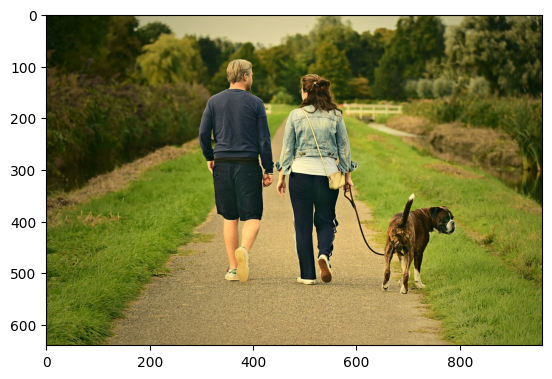

In [36]:
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

In [37]:
# to output lenght of each layer
for output in layer_outputs:
    print(len(output[0]))
    # print(output)

85
85
85


In [38]:
len(layer_outputs)

3

In [39]:
for output in layer_outputs:
    for detection in output:
        print(detection)

[0.0093189  0.00937537 0.02214065 0.02273702 0.0001544  0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.        ]
[1.3590973e-02 1.6005784e-02 3.2308199e-02 4.3768562e-02 2.2254628e-05
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.00

In [40]:
# first and second objects from each output layer contain coordinates on left higher point of bounding box, third and
# fourth objects from each output layer contain width and height of bounding box and the last object contains the probability that an object
# corresponds to the selected class
detection[0], detection[1], detection[2], detection[3], detection[4]

(0.96422833, 0.9575566, 0.5548381, 0.59025335, 6.708742e-07, 0.0)

In [41]:
# output lenght of each output- array 
len(output[0])

85

In [42]:
ClassIndex = []
confidence = []
bbox = []

# iterate through each output object (array) into layer_outputs (there are only three of them - after all, the model has three (unconnected) output layers)

# each output is an array with a set of probabilities with which the image can correspond to one or another
# class from the labels array, also contains the coordinates of the bounding box - the first four values

# and confidence for each object detected in the image. - fifth value

# Typically this includes 4 coordinates (x, y, width, height)
# for the bounding box and one value for confidence.

# the rest is the probability of belonging to classes

# confidence - the probability with which an object belongs to the selected class
for output in layer_outputs:
    # iterate through all the objects in each output array and call each of them detection
    # IMPORTANT - the first five detection objects are the coordinates for the bounding rectangle and confidence
    for detection in output:
        # therefore, we only classify as probabilities all detection objects after the first five elements
        scores = detection[5:]
        # in the classic way we select the index of the highest probability in the scores() array
        class_index = np.argmax(scores)
        # apply the index to the array and find the probability
        conf = scores[class_index]
        # if the probability is more than half, draw a bounding box 
        if conf > 0.5:
            # calculate the coordinates of the center point
            center_x = int(detection[0]*width)
            center_y = int(detection[1]*height)
            # define the width and height of the bounding boxи 
            w = int(detection[2]*width)
            h = int(detection[3]*height)
            # coordinates of the upper left corner of the bounding box 
            x = int(center_x - w/2)   # x - w/2
            y = int(center_y - h/2)  # y - h/2
            bbox.append([x, y, w, h])
            confidence.append(float(conf))
            ClassIndex.append(class_index)

In [43]:
print(output[0])

[6.3233905e-02 6.4662397e-02 2.4177408e-01 3.3700559e-01 1.2582988e-06
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
 0.000

In [44]:
# The cv2.dnn.NMSBoxes() function returns the bounding box indices from the bbox list,
# which remain after applying non-maximum suppression (NMS).
# These indices correspond to bounding boxes that are considered "good" or necessary for further analysis.


# thus indexes is an array of indexes of the frames that will be in the image
# since n objects are detected in the image, len(indexes) = n


# The bounding box index is the index of the object in the list of all detected objects in the image.
# Each object has its own bounding box, which defines the area in which the object resides.
# The bounding box index allows you to refer to the corresponding data (coordinates, class, confidence, etc.)
# of this object in arrays containing information about all discovered objects.


indexes = cv2.dnn.NMSBoxes(bbox, confidence, 0.5, 0.4)

# Output the results on the image


# select opencv fonts for which the class name will be written above the image
font = cv2.FONT_HERSHEY_COMPLEX_SMALL
# create an array of random color (from 0 to 255) that will be used for bounding box drawing 
colors = np.random.uniform(0, 255, size=(len(bbox), 3))

# if at least one object is found
if len(indexes) > 0:
    # convert indexes into a one-dimensional array
    for i in indexes.flatten():
        # Gets the coordinates and dimensions of the bounding box for the object at index i.
        # bbox contains a list of all bounding boxes for detected objects - even those not filtered.
        x, y, w, h = bbox[i]
        # selects the desired class from the labels array and converts it to a string
        label = str(labels[ClassIndex[i]])
        # converts the probability to a string as well
        confidence_str = str(round(confidence[i],2))
        # selects a random color 
        color = colors[i]
        # drawing a rectangle with the rectangle function
        # img - the image on which the rectangle will be drawn
        # (x, y) - coordinates of the upper left corner
        # (x + w, y + h) - coordinates of the lower right corner
        # color - color
        #3 - rectangle thickness

        cv2.rectangle(img, (x, y), (x + w, y + h), color, 3)

        # output text
        # img - image
        # label + " " + confidence_str - text (class name + probability)
        # (x, y + 20) - place where the text will be
        # font - font
        #2 - font size
        # color-variable - color
        #2 - text line thickness 


        cv2.putText(img, label + " " + confidence_str, (x, y + 20), font, 2, color, 2)

        # code to draw a dot in the center of each image
        cv2.circle(img, (int(x + w/2), int(y + h/2)), 5, color, thickness=cv2.FILLED)

       

# display image
cv2.imshow("Image", img)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
print(indexes)

[25 27 31]


In [ ]:
print(ClassIndex)
print(confidence)
print(bbox)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 16, 16, 16, 16, 16, 16, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 16, 16]
[0.9603806138038635, 0.9616679549217224, 0.5529235601425171, 0.9967558979988098, 0.7101514935493469, 0.9976029992103577, 0.9814183712005615, 0.955112099647522, 0.5125303268432617, 0.9881817698478699, 0.720930278301239, 0.993674635887146, 0.9389784932136536, 0.9403612613677979, 0.9390337467193604, 0.9851425290107727, 0.9852823615074158, 0.9855712056159973, 0.9297810196876526, 0.9338091015815735, 0.908907413482666, 0.915870189666748, 0.9973253607749939, 0.9974158406257629, 0.9979643821716309, 0.9983659982681274, 0.993292510509491, 0.9947000741958618, 0.991755485534668, 0.9946116209030151, 0.943558931350708, 0.9924411177635193]
[[291, 83, 152, 415], [294, 89, 151, 403], [291, 103, 151, 400], [292, 94, 150, 415], [297, 98, 148, 405], [295, 90, 149, 424], [434, 117, 159, 395], [436, 124, 167, 382], [297, 112, 149, 419], [438, 123, 153, 400], [442, 122, 157, 405], [440, 116, 159, 413], [6

In [ ]:

# полезный код 
# import os

# folder = "/Users/maxkucher/python/CV/data_images"
# counter = 1
# for filename in os.listdir(folder):
#     if filename.endswith(".jpg"):
#         old_filename = os.path.join(folder, filename)
#         new_filename = os.path.join(folder, str(counter) + ".jpg")
#         os.rename(old_filename, new_filename)
#         counter += 1


